In [1]:
import cvm_inference
import numpy as np
import os.path
import matplotlib.pyplot as plt
import cv2

/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


### Create instance of the inference object

In [2]:
inference = cvm_inference.CVMInference()
NUM_IMAGES = 7

VGG16: trainable = False
VGG16: trainable = False
Siamese_FC: dim_reduction  trainable = False
CVMInference object created


### Extract decriptors from each satellite patch image

In [8]:
filename = 'aerial_descriptors_sat.npz'
inference.aerial_image_prefix = "../Data/CVUSA/test_sat/"
inference.global_count = 0

if os.path.isfile(filename):
    print ("Aerial Descriptors file already exists")
else:
    print ("Calculating aerial file descriptors. This might take some time...")
    aerial_descriptors_list = []
    for i in range(NUM_IMAGES):
        batch_descriptors = inference.forward(inference.next_images(is_ground = False), is_ground = False)
        print(batch_descriptors.shape)
        
        aerial_descriptors_list.append(batch_descriptors)
    aerial_descriptors = np.vstack([batch for batch in aerial_descriptors_list if batch is not None])
    print(aerial_descriptors.shape)
    np.savez(filename, aerial_descriptors)
    

Calculating aerial file descriptors. This might take some time...
loading model...
INFO:tensorflow:Restoring parameters from ../Model/CVM-NET-I/0/model.ckpt
   Model loaded from: ../Model/CVM-NET-I/0/model.ckpt
load model...FINISHED
validate...
   compute global descriptors
(1, 4096)
loading model...
INFO:tensorflow:Restoring parameters from ../Model/CVM-NET-I/0/model.ckpt
   Model loaded from: ../Model/CVM-NET-I/0/model.ckpt
load model...FINISHED
validate...
   compute global descriptors
(1, 4096)
loading model...
INFO:tensorflow:Restoring parameters from ../Model/CVM-NET-I/0/model.ckpt
   Model loaded from: ../Model/CVM-NET-I/0/model.ckpt
load model...FINISHED
validate...
   compute global descriptors
(1, 4096)
loading model...
INFO:tensorflow:Restoring parameters from ../Model/CVM-NET-I/0/model.ckpt
   Model loaded from: ../Model/CVM-NET-I/0/model.ckpt
load model...FINISHED
validate...
   compute global descriptors
(1, 4096)
loading model...
INFO:tensorflow:Restoring parameters from

### Extract decriptors from each satellite patch image

In [9]:

filename = 'aerial_descriptors_uav.npz'
inference.aerial_image_prefix = "../Data/CVUSA/test_uav/"
inference.global_count = 0

if os.path.isfile(filename):
    print ("Aerial Descriptors file already exists")
else:
    print ("Calculating aerial file descriptors. This might take some time...")
    aerial_descriptors_list = []
    for i in range(NUM_IMAGES):
        batch_descriptors = inference.forward(inference.next_images(is_ground = False), is_ground = False)
        print(batch_descriptors.shape)
        
        aerial_descriptors_list.append(batch_descriptors)
    aerial_descriptors = np.vstack([batch for batch in aerial_descriptors_list if batch is not None])
    print(aerial_descriptors.shape)
    np.savez(filename, aerial_descriptors)

Calculating aerial file descriptors. This might take some time...
loading model...
INFO:tensorflow:Restoring parameters from ../Model/CVM-NET-I/0/model.ckpt
   Model loaded from: ../Model/CVM-NET-I/0/model.ckpt
load model...FINISHED
validate...
   compute global descriptors
(1, 4096)
loading model...
INFO:tensorflow:Restoring parameters from ../Model/CVM-NET-I/0/model.ckpt
   Model loaded from: ../Model/CVM-NET-I/0/model.ckpt
load model...FINISHED
validate...
   compute global descriptors
(1, 4096)
loading model...
INFO:tensorflow:Restoring parameters from ../Model/CVM-NET-I/0/model.ckpt
   Model loaded from: ../Model/CVM-NET-I/0/model.ckpt
load model...FINISHED
validate...
   compute global descriptors
(1, 4096)
loading model...
INFO:tensorflow:Restoring parameters from ../Model/CVM-NET-I/0/model.ckpt
   Model loaded from: ../Model/CVM-NET-I/0/model.ckpt
load model...FINISHED
validate...
   compute global descriptors
(1, 4096)
loading model...
INFO:tensorflow:Restoring parameters from

In [10]:
# Load Sat Descriptors
filename = 'aerial_descriptors_sat.npz'
if os.path.isfile(filename):
    sat_descriptors = np.load(filename)['arr_0']
    print(sat_descriptors.shape)
    print ("Found satellite descriptors file")
else:
    print ("No satellite descriptors file was found... Matching won't be possible")
    
# Load UAV Descriptors
filename = 'aerial_descriptors_uav.npz'
if os.path.isfile(filename):
    uav_descriptors = np.load(filename)['arr_0']
    print(uav_descriptors.shape)
    print ("Found uav descriptors file")
else:
    print ("No uav descriptors file was found... Matching won't be possible")

(7, 4096)
Found satellite descriptors file
(7, 4096)
Found uav descriptors file


In [11]:
# Load Images for visualization
inference.aerial_image_prefix = "../Data/CVUSA/test_uav/"
uav_images = inference.load_images_raw(is_ground = False, num_images = NUM_IMAGES)
inference.aerial_image_prefix = "../Data/CVUSA/test_sat/"
satellite_images = inference.load_images_raw(is_ground = False, num_images = NUM_IMAGES)

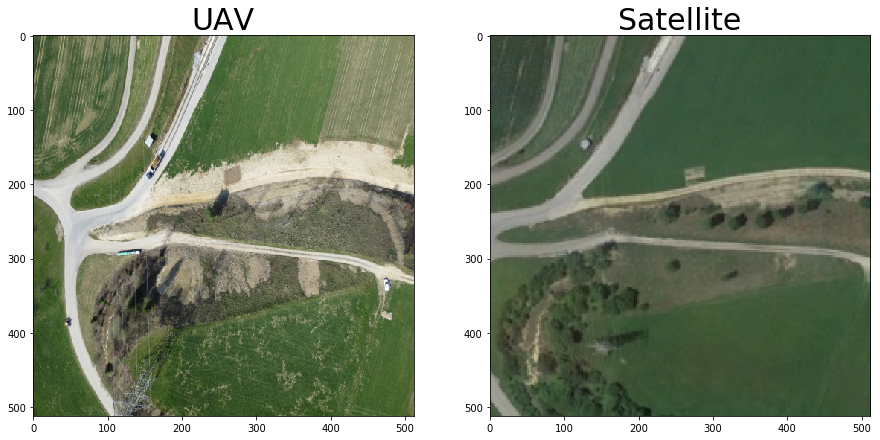

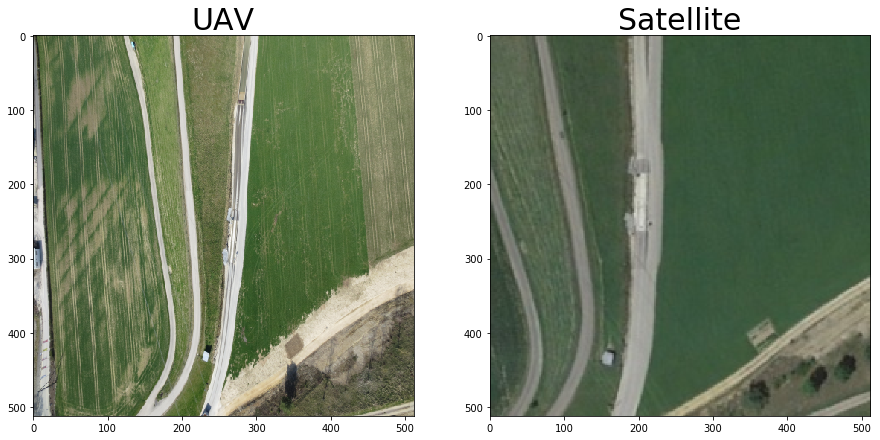

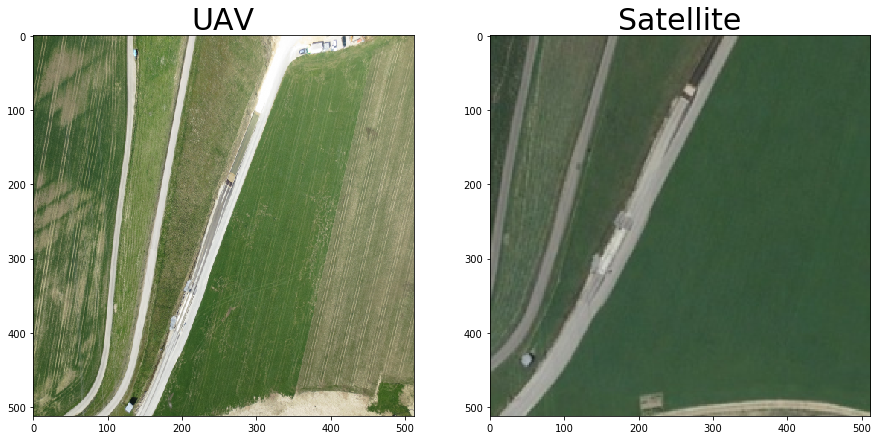

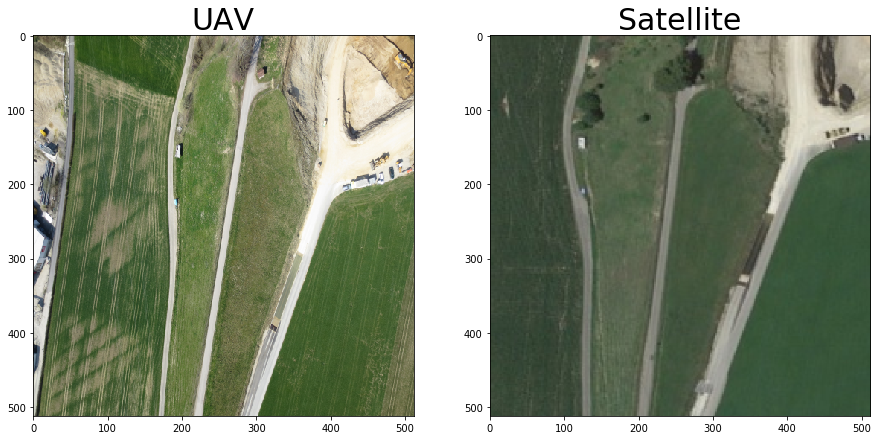

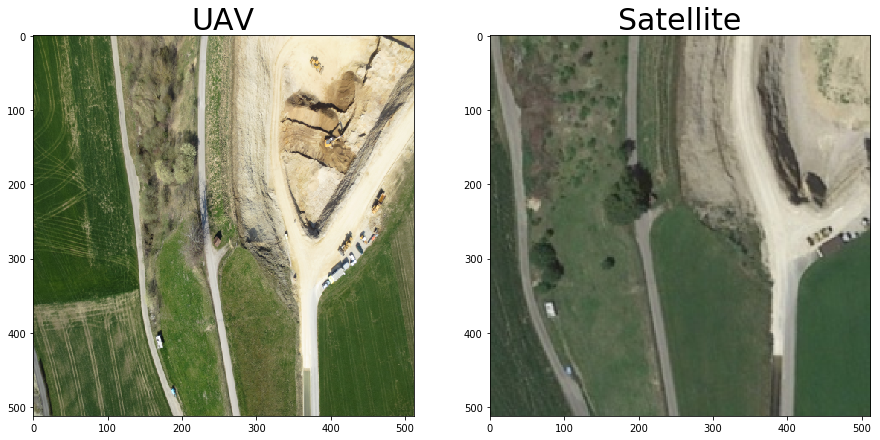

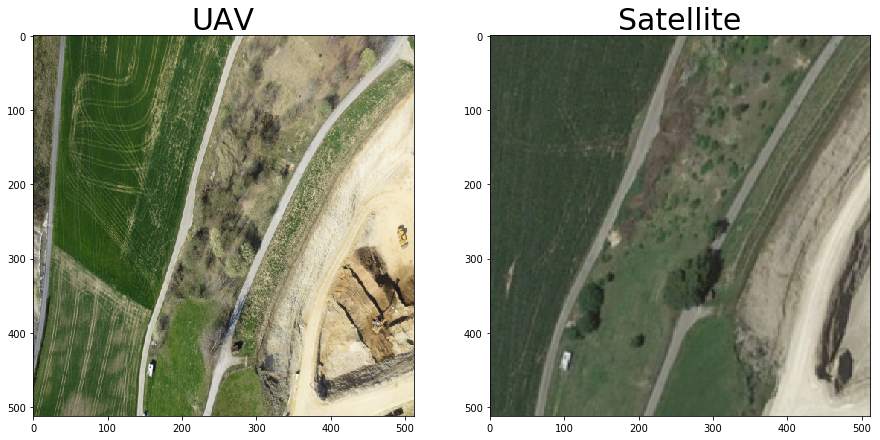

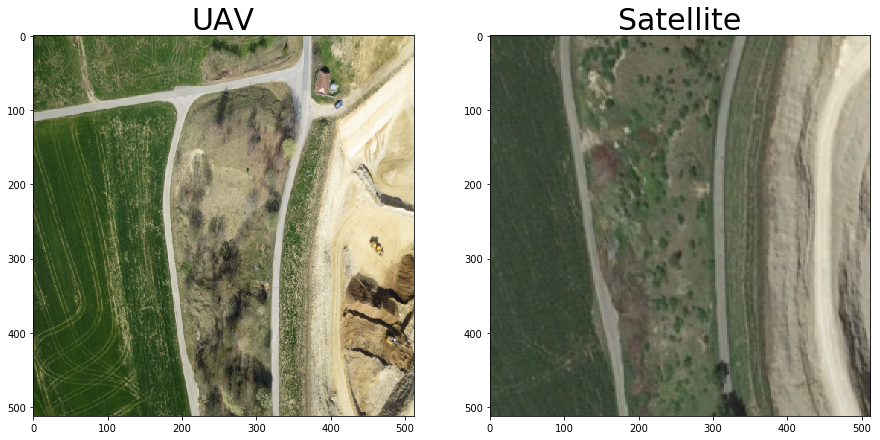

In [13]:
# Show Images to be matched
for i in range(NUM_IMAGES):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,8))
    ax1.imshow(uav_images[i])
    ax1.set_title('UAV', fontsize=30)
    ax2.imshow(satellite_images[i])
    ax2.set_title('Satellite', fontsize=30)
    plt.show()

In [14]:
# Softmax Function
def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0) # only difference

In [15]:
# Calculate match probability and sort dictionary so we know the best match in each case
euclidean_distances_list = []
for uav_descriptor in uav_descriptors:
    euclidian_distances = []
    for sat_descriptor in sat_descriptors:
        dist = np.linalg.norm(sat_descriptor-uav_descriptor)
        #print(dist)
        if dist == 0.0:
            dist = 0.1
        euclidian_distances.append(1/dist)
    indexes = np.arange(sat_descriptors.shape[0])
    distances_dict = dict(zip(indexes.T, softmax(euclidian_distances)))
    sorted_distances_dict = sorted(distances_dict.items(), key = lambda x:-x[1])
    sorted_distances_dict
    euclidean_distances_list.append(sorted_distances_dict)

0.78033566
0.9079263
1.0327387
0.80865365
0.8321012
0.8425351
1.0728338
1.102462
0.87652403
0.9783626
0.7614493
0.91544193
1.0390778
0.8822524
1.2410511
1.0856981
0.94826895
0.95127016
1.1313121
1.0548714
1.0705041
1.1236641
0.9253908
1.0311911
0.682959
0.78109056
0.9826395
0.8145248
0.8163458
0.7089271
0.9551732
0.57079595
0.42934972
0.67167026
0.6700405
0.93528616
0.9787694
0.96004987
0.87793636
0.87550944
0.6029667
0.9257667
0.94167906
1.0089961
1.2041622
0.84080654
0.6854959
0.8711027
0.8013054


In [16]:
# Function used to add a green frame to the correct match
def add_frame(image, is_ground_truth = True):
    if not is_ground_truth:
        return image
    img = image.copy()
    b = 8
    c=(0,255,0)
    thickness = 10
    width, height, _ = img.shape
    p1 = (b , b)
    p2 = (b , height - b)
    p3 = (width - b , height - b)
    p4 = (width - b , b)
    cv2.line(img, p1, p2, c, thickness)
    cv2.line(img, p2, p3, c, thickness)
    cv2.line(img, p3, p4, c, thickness)
    cv2.line(img, p4, p1, c, thickness)
    return img

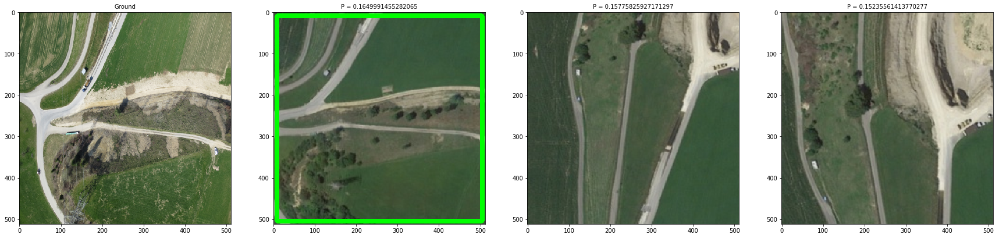

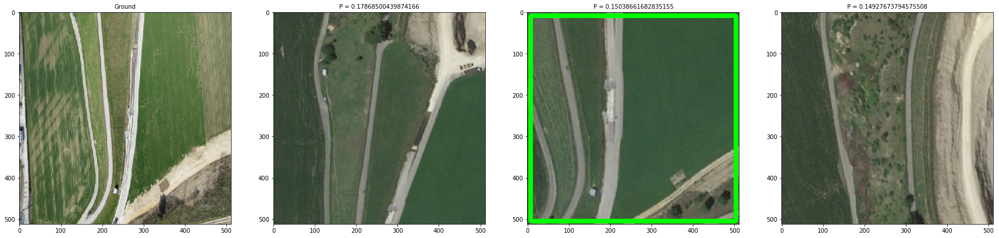

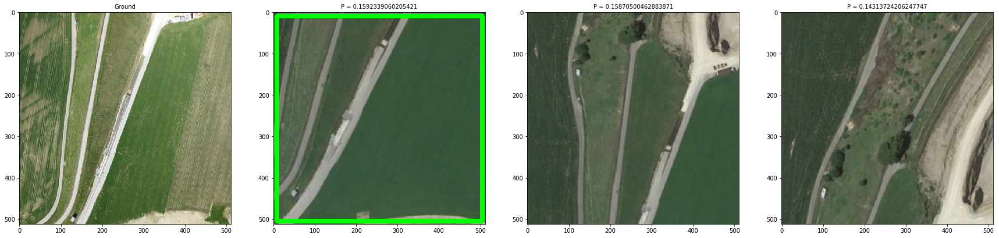

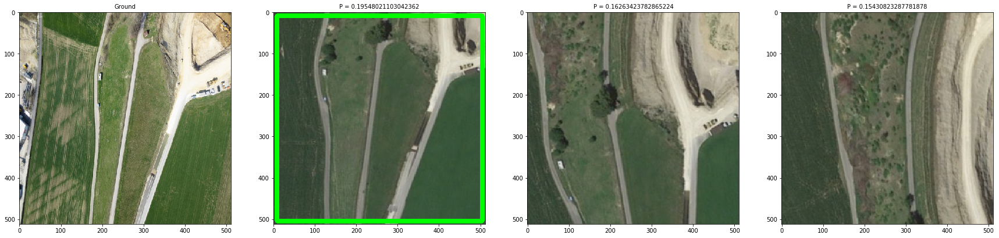

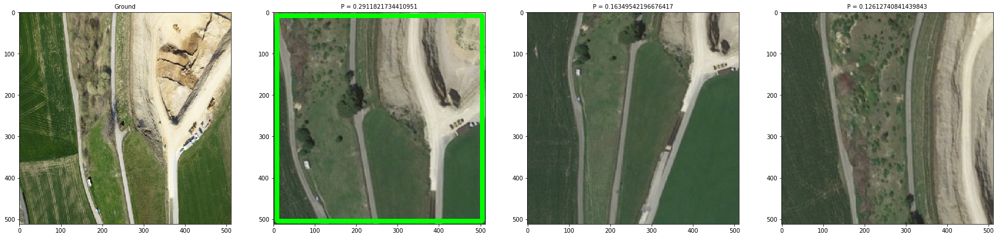

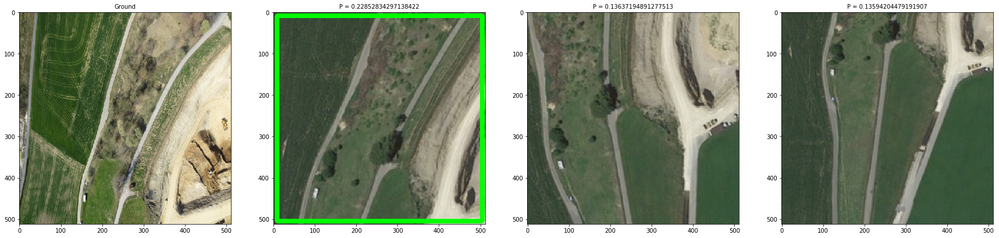

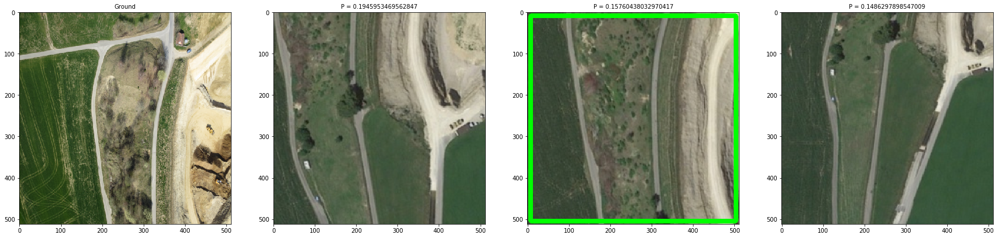

In [17]:
# Show matches
i = 0
for euclidian_dist in euclidean_distances_list:
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,10))
    ax1.imshow(uav_images[i])
    ax1.set_title('Ground', fontsize=10)
    ax2.imshow(add_frame(satellite_images[euclidian_dist[0][0]], i == euclidian_dist[0][0]))
    ax2.set_title('P = ' + str(euclidian_dist[0][1]), fontsize=10)
    ax3.imshow(add_frame(satellite_images[euclidian_dist[1][0]], i == euclidian_dist[1][0]))
    ax3.set_title('P = ' + str(euclidian_dist[1][1]), fontsize=10)
    ax4.imshow(add_frame(satellite_images[euclidian_dist[2][0]], i == euclidian_dist[2][0]))
    ax4.set_title('P = ' + str(euclidian_dist[2][1]), fontsize=10)
    #ax5.imshow(add_frame(satellite_images[euclidian_dist[3][0]], i == euclidian_dist[3][0]))
    #ax5.set_title('P = ' + str(euclidian_dist[3][1]), fontsize=10)
    #ax6.imshow(add_frame(satellite_images[euclidian_dist[4][0]], i == euclidian_dist[4][0]))
    #ax6.set_title('P = ' + str(euclidian_dist[4][1]), fontsize=10)
    plt.show()
    i += 1